# Tiling

## Uniform tilings in hyperbolic plane
References:
- [Uniform tilings in hyperbolic plane](https://en.wikipedia.org/wiki/Uniform_tilings_in_hyperbolic_plane)
- [hyperbolic](https://github.com/cduck/hyperbolic)
- [geometry tools](https://github.com/tjweisman/geometry_tools)
- [Hyperbolic Cellular Automata Simulator](https://dmishin.github.io/hyperbolic-ca-simulator/help.html) with [source code](https://github.com/dmishin/hyperbolic-ca-simulator)
- [Binary tiling](https://en.wikipedia.org/wiki/Binary_tiling)
- [Coxeter decompositions of hyperbolic polygons](https://en.wikipedia.org/wiki/Coxeter_decompositions_of_hyperbolic_polygons)
- [Poincaré disk model](https://en.wikipedia.org/wiki/Poincar%C3%A9_disk_model)
- [Coxeter group](https://en.wikipedia.org/wiki/Coxeter_group)
- [Triangle group](https://en.wikipedia.org/wiki/Triangle_group)

In [2]:
from geometry_tools import hyperbolic, coxeter, drawtools
from geometry_tools.automata import fsa

In [3]:
from geometry_tools.hyperbolic import Model

print(list(Model))

[<Model.POINCARE: 'poincare'>, <Model.KLEIN: 'klein'>, <Model.HALFSPACE: 'halfspace'>, <Model.HYPERBOLOID: 'hyperboloid'>, <Model.PROJECTIVE: 'projective'>]


In [4]:
def getPolygon(t:tuple[int,int,int],n:int)->hyperbolic.Polygon:
    triangle_group = coxeter.TriangleGroup(t)
    triangle_rep = triangle_group.hyperbolic_rep()
    triangle_fsa = triangle_group.automaton()

    # find a fundamental domain for the action by finding 
    # fixed points of length-2 elements
    vertices = triangle_rep.isometries(["ab", "bc", "ca"]).fixed_point()
    fund_triangle = hyperbolic.Polygon(vertices)

    # find all orientation-preserving isometries of length at most n
    words = triangle_fsa.enumerate_words(n)
    even_words = [word for word in words if len(word) % 2 == 0]
    pos_isometries = triangle_rep.isometries(even_words)
    return pos_isometries @ fund_triangle

### Triangle group
#### Definition
Let $l$, $m$, $n$ be integers greater than or equal to $2$. A **triangle group** $\Delta(l,m,n)$ is a group of motions of the *Euclidean plane*, the *two-dimensional sphere*, the *real projective plane*, or the *hyperbolic plane* generated by the reflections in the sides of a triangle with angles $\pi/l$, $\pi/m$ and $\pi/n$ (measured in [radians](https://en.wikipedia.org/wiki/Radian)). The product of the reflections in two adjacent sides is a rotation by the angle which is twice the angle between those sides, $2\pi/l$, $2\pi/m$ and $2\pi/n$. Therefore, if the generating reflections are labeled $a$, $b$, $c$ and the angles between them in the cyclic order are as given above, then the following relations hold:
1. $a^2+b^2+c^2=1$
2. $(ab)^l=(bc)^n=(ca)^m=1$.

It is a theorem that all other relations between $a$, $b$, $c$ are consequences of these relations and that $\Delta(l,m,n)$ is a [discrete group](https://en.wikipedia.org/wiki/Discrete_group) of motions of the corresponding space. Thus a triangle group is a [reflection group](https://en.wikipedia.org/wiki/Reflection_group) that admits a [group presentation](https://en.wikipedia.org/wiki/Group_presentation)

$$
\Delta(l,m,n)=<a,b,c\ |\ a^2+b^2+c^1=(ab)^l=(bc)^n=(ca)^m=1>
$$

An abstract group with this presentation is a [Coxeter group](https://en.wikipedia.org/wiki/Coxeter_group) with three generators.

#### Classifications
Given any natural numbers $l, m, n > 1$ exactly one of the classical two-dimensional geometries (Euclidean, spherical, or hyperbolic) admits a triangle with the angles $(\pi/l, \pi/m, \pi/n)$, and the space is tiled by reflections of the triangle. The sum of the angles of the triangle determines the type of the geometry by the [Gauss–Bonnet theorem](https://en.wikipedia.org/wiki/Gauss%E2%80%93Bonnet_theorem): it is Euclidean if the angle sum is exactly $\pi$, spherical if it exceeds $\pi$ and hyperbolic if it is strictly smaller than $\pi$. Moreover, any two triangles with the given angles are congruent. Each triangle group determines a tiling, which is conventionally colored in two colors, so that any two adjacent tiles have opposite colors.

##### The Euclidean case

$$\frac{1}{l}+\frac{1}{m}+\frac{1}{n}=1$$

The triangle group is the infinite [symmetry group](https://en.wikipedia.org/wiki/Symmetry_group) of a certain [tessellation](https://en.wikipedia.org/wiki/Tessellation) (or tiling) of the Euclidean plane by triangles whose angles add up to $\pi$ (or $180^{\circ}$). Up to permutations, the triple $(l, m, n)$ is one of the triples $(2,3,6)$, $(2,4,4)$, $(3,3,3)$. The corresponding triangle groups are instances of [wallpaper groups](https://en.wikipedia.org/wiki/Wallpaper_group).

##### The spherical case

$$\frac{1}{l}+\frac{1}{m}+\frac{1}{n}>1$$

The triangle group is the finite symmetry group of a tiling of a unit sphere by spherical triangles, or [Möbius triangles](https://en.wikipedia.org/wiki/M%C3%B6bius_triangle), whose angles add up to a number greater than π. Up to permutations, the triple $(l,m,n)$ has the form $(2,3,3)$, $(2,3,4)$, $(2,3,5)$, or $(2,2,n), n > 1$. Spherical triangle groups can be identified with the symmetry groups of regular polyhedra in the three-dimensional Euclidean space: $\Delta(2,3,3)$ corresponds to the tetrahedron, $\Delta(2,3,4)$ to both the cube and the octahedron (which have the same symmetry group), $\Delta(2,3,5)$ to both the dodecahedron and the icosahedron. The groups $\Delta(2,2,n), n > 1$ of dihedral symmetry can be interpreted as the symmetry groups of the family of dihedra, which are degenerate solids formed by two identical regular $n$-gons joined together, or dually hosohedra, which are formed by joining $n$ digons together at two vertices.

The [spherical tiling](https://en.wikipedia.org/wiki/Spherical_tiling) corresponding to a regular polyhedron is obtained by forming the [barycentric subdivision](https://en.wikipedia.org/wiki/Barycentric_subdivision) of the polyhedron and projecting the resulting points and lines onto the circumscribed sphere. In the case of the tetrahedron, there are four faces and each face is an equilateral triangle that is subdivided into $6$ smaller pieces by the medians intersecting in the center. The resulting tesselation has $4 × 6=24$ spherical triangles (it is the spherical [disdyakis cube](https://en.wikipedia.org/wiki/Disdyakis_cube)).

These groups are finite, which corresponds to the compactness of the sphere – areas of discs in the sphere initially grow in terms of radius, but eventually cover the entire sphere.

### Geometry tools

In [5]:
import copy

import numpy as np

import matplotlib.pyplot as plt
from matplotlib.patches import Circle, Arc, PathPatch, Rectangle, Polygon, Annulus
from matplotlib.collections import LineCollection, PolyCollection, EllipseCollection

from matplotlib.transforms import Affine2D
from matplotlib.path import Path

from geometry_tools import hyperbolic, utils, projective, complex_projective
from geometry_tools.hyperbolic import Model


#I played around with this a bit, but it's an eyeball test
#TBH. Determines the radius at which we start approximating circular
#arcs with straight lines.
RADIUS_THRESHOLD = 80

#how far apart points can be before we decide that we ordered the
#polygon wrong
DISTANCE_THRESHOLD = 1e-4

#the default amount of "room" we leave outside the boundary of our model
DRAW_NEIGHBORHOOD = 0.1

#when drawing objects "to infinity", how far offscreen we draw them
#(as a % of the width/height)
OFFSCREEN_FACTOR = 0.1

#this is a bit unpythonic since these are meant to be constants
def default_model_limits(model):
    if model == Model.POINCARE or model == Model.KLEIN:
        return ((-1 - DRAW_NEIGHBORHOOD, 1 + DRAW_NEIGHBORHOOD),
                (-1 - DRAW_NEIGHBORHOOD, 1 + DRAW_NEIGHBORHOOD))

    if model == Model.HALFSPACE:
        return ((-6., 6.),
                (-1 * DRAW_NEIGHBORHOOD, 8.))
    
class DrawingError(Exception):
    """Thrown if we try and draw an object in a model which we haven't
    implemented yet.

    """
    pass

In [6]:
def get_vertical_segment(endpts):
    ordered_endpts = endpts[:]
    if (np.isnan(endpts[0,0]) or
        endpts[0, 0] < left_infinity or
        endpts[0, 0] > right_infinity):
        ordered_endpts = np.flip(endpts, axis=0)

    if (np.isnan(ordered_endpts[1, 0]) or
        ordered_endpts[1, 0] < left_infinity or
        ordered_endpts[1, 0] > right_infinity):

        ordered_endpts[1, 1] = up_infinity

    ordered_endpts[1, 0] = ordered_endpts[0, 0]

    return ordered_endpts

def get_circle_arcpath(center, radius, theta):
    """Get a matplotlib path object for the circular arc representing this
    geometric object.

    """
    cx, cy = center
    transform = Affine2D()
    transform.scale(radius)
    transform.translate(cx, cy)
    return transform.transform_path(Path.arc(theta[0], theta[1]))

def get_straight_arcpath(model,segment):
    endpts = segment.endpoint_coords(model)

    if model == Model.POINCARE:
        return Path(endpts, [Path.MOVETO, Path.LINETO])
    if model == Model.HALFSPACE:
        v_endpts = get_vertical_segment(endpts)
        return Path(v_endpts, [Path.MOVETO, Path.LINETO])

def get_polygon_arcpath(model,
                        polygon,
                        radius_threshold=RADIUS_THRESHOLD,
                        distance_threshold=DISTANCE_THRESHOLD):
    vertices = np.zeros((0, 2))
    codes = np.zeros((0,))
    first_segment = True

    polysegs = polygon.get_edges()
    centers, radii, thetas = polysegs.circle_parameters(model=model)

    for center, radius, theta, segment in zip(centers, radii, thetas, polysegs):
        if not np.isnan(radius) and radius < radius_threshold:
            g_path = get_circle_arcpath(center, radius, theta)
        else:
            g_path = get_straight_arcpath(model,segment)

        g_verts = g_path.vertices
        p1, p2 = segment.get_end_pair(as_points=True)

        p1_opp_dist = np.linalg.norm(p1.coords(model) - g_verts[-1])
        p2_opp_dist = np.linalg.norm(p2.coords(model) - g_verts[0])
        if (p1_opp_dist < distance_threshold or
            p2_opp_dist < distance_threshold):
            g_verts = g_verts[::-1]

        g_codes = copy.deepcopy(g_path.codes)
        if not first_segment:
            g_codes[0] = Path.LINETO

        vertices = np.concatenate((vertices, g_verts), axis=-2)
        codes = np.concatenate((codes, g_codes))
        first_segment = False

    return Path(vertices, codes)


In [7]:
def getFigAx(model,figsize,bg='black'):
    default_x, default_y = default_model_limits(model)

    xlim = default_x
    ylim = default_y

    width = xlim[1] - xlim[0]
    height = ylim[1] - ylim[0]

    left_infinity = xlim[0] - OFFSCREEN_FACTOR * width
    right_infinity = xlim[1] + OFFSCREEN_FACTOR * width
    up_infinity = ylim[1] + OFFSCREEN_FACTOR * height
    down_infinity = ylim[0] - OFFSCREEN_FACTOR * height
    h_infinity = right_infinity - left_infinity
    v_infinity = up_infinity - down_infinity

    fig, ax = plt.subplots(figsize=(figsize, figsize))
    ax.set_facecolor(bg)
    fig.set_facecolor(bg)
    plt.tight_layout()
    ax.axis('off')
    ax.set_aspect('equal')
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)

    return (fig,ax)

In [8]:
def draw_polygon(ax, model, polygon, **kwargs):
    default_kwargs = {
        "facecolor": "none",
        "edgecolor": "black"
    }
    transform = hyperbolic.identity(2)
    for key, value in kwargs.items():
        default_kwargs[key] = value

    polylist = transform @ polygon.flatten_to_unit()

    if model == Model.KLEIN:
        polys = PolyCollection(polylist.coords("klein"), **default_kwargs)
        ax.add_collection(polys)

    elif model == Model.POINCARE or model == Model.HALFSPACE:
        for poly in polylist:
            path = get_polygon_arcpath(model,poly)
            ax.add_patch(PathPatch(path, **default_kwargs))
    else:
        raise DrawingError("Drawing polygons in model '{}' is not implemented".format(model))



In [9]:
polygon=getPolygon((2,3,7),30)
len(polygon)

3220

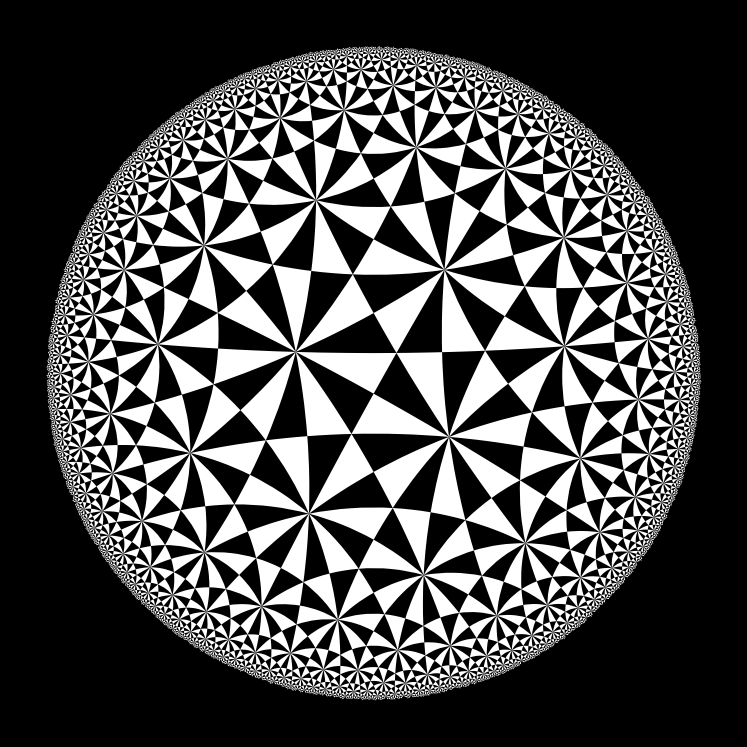

In [10]:
model=Model.POINCARE
fig,ax=getFigAx(model,8)
draw_polygon(ax,model,polygon,facecolor='white',edgecolor='none')

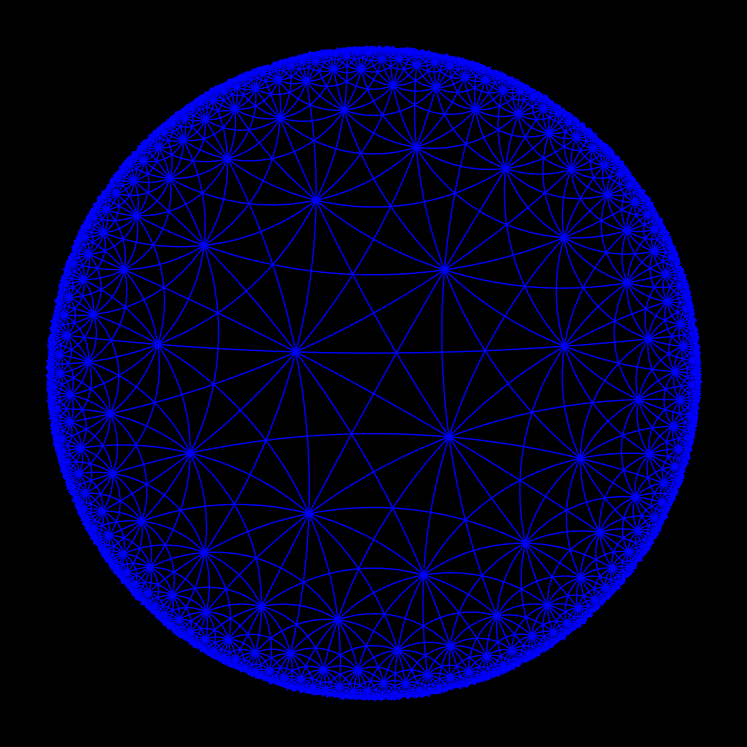

In [11]:
fig,ax=getFigAx(model,8)
draw_polygon(ax,model,polygon,facecolor='none',edgecolor='blue')

In [12]:
polygon=getPolygon((2,3,0),25)
len(polygon)

5836

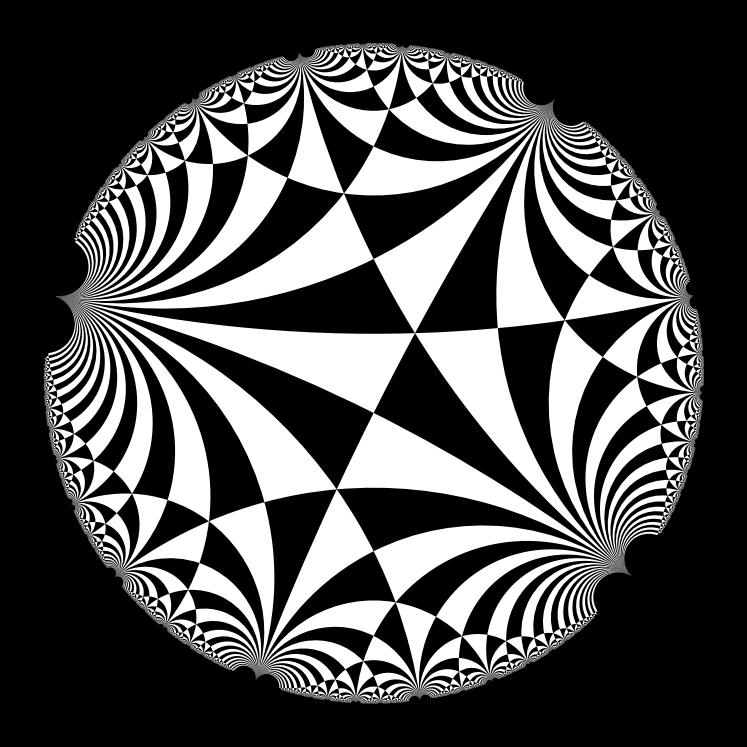

In [13]:
fig,ax=getFigAx(model,8)
draw_polygon(ax,model,polygon,facecolor='white',edgecolor='none')

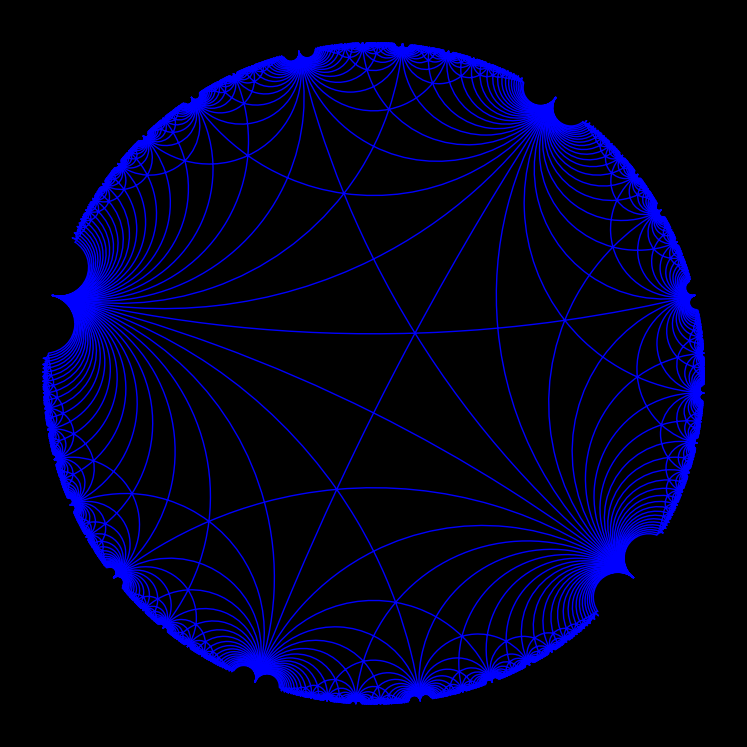

In [14]:
fig,ax=getFigAx(model,8)
draw_polygon(ax,model,polygon,facecolor='none',edgecolor='blue')

In [15]:
#fig.savefig('poincare_2_3_0.png',transparent=False)

In [16]:
polygon=getPolygon((4,8,14),12)
len(polygon)

5889

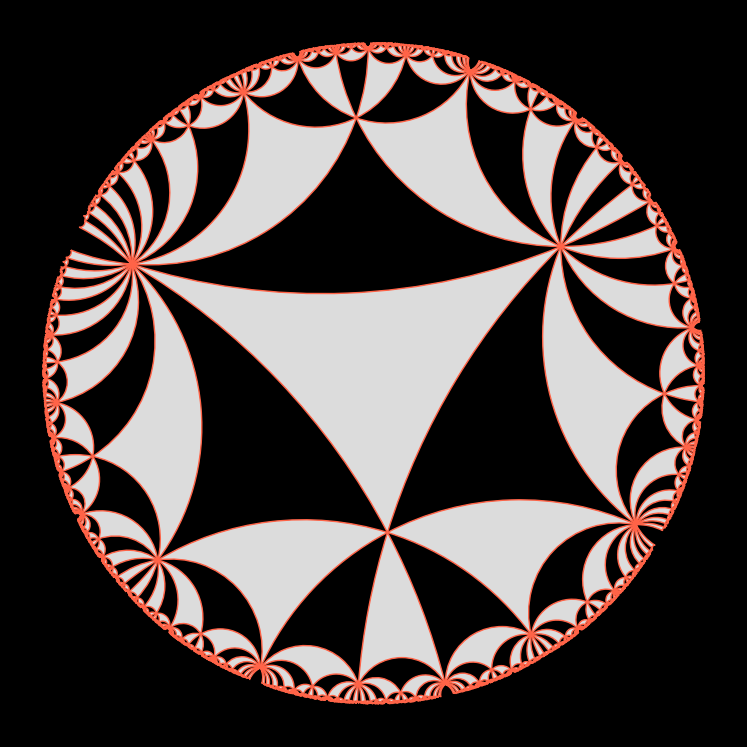

In [17]:
fig,ax=getFigAx(model,8)
draw_polygon(ax,Model.POINCARE,polygon,facecolor='gainsboro',edgecolor='tomato')

In [18]:
polygon=getPolygon((14,7,3),13)
len(polygon)

3579

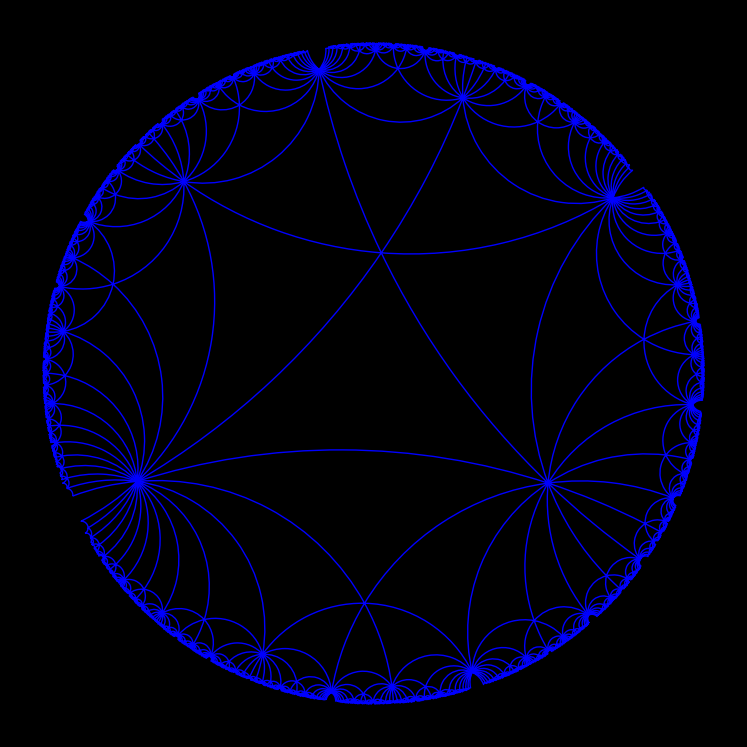

In [19]:
fig,ax=getFigAx(model,8)
draw_polygon(ax,Model.POINCARE,polygon,facecolor='none',edgecolor='blue')

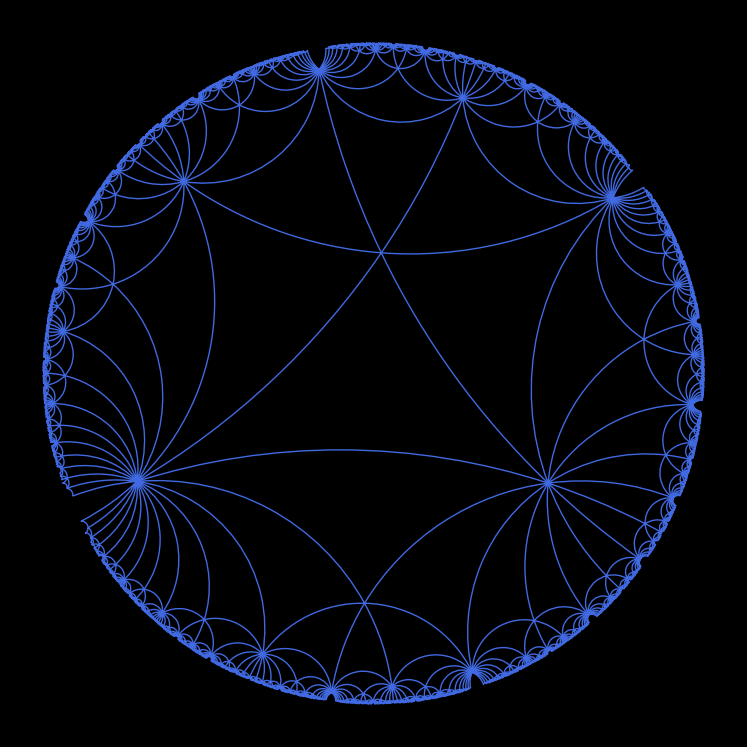

In [20]:
fig,ax=getFigAx(model,8)
draw_polygon(ax,Model.POINCARE,polygon,facecolor='none',edgecolor='royalblue')

In [21]:
polygon=getPolygon((20,3,3),15)
len(polygon)

3191

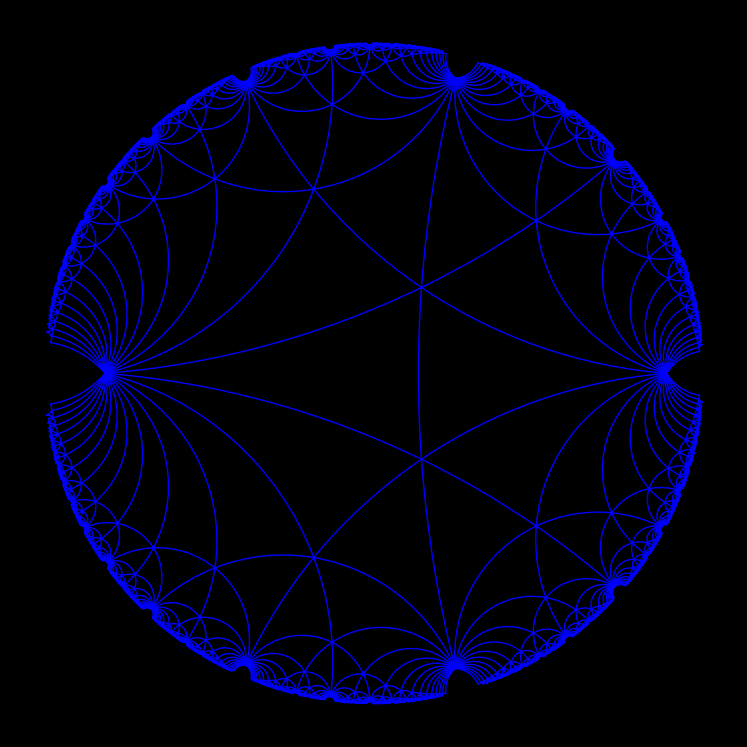

In [22]:
fig,ax=getFigAx(model,8)
draw_polygon(ax,Model.POINCARE,polygon,facecolor='none',edgecolor='blue')

## Hyperbolic

In [23]:
import math
import numpy as np

import drawSvg as draw
from drawSvg import Drawing
from hyperbolic import euclid, util
from hyperbolic.poincare.shapes import *
from hyperbolic.poincare import Transform
from hyperbolic.poincare.util import radialEuclidToPoincare, radialPoincareToEuclid, \
                                     poincareToEuclidFactor, triangleSideForAngles
import hyperbolic.tiles as htiles

In [24]:
def drawTiles(drawing, tiles):
    for tile in tiles:
        drawing.draw(tile, hwidth=0.02, fill='white')
    for tile in tiles:
        drawing.draw(tile, drawVerts=True, hradius=0.15, hwidth=0.02,
                     fill='black', opacity=0.6)

In [25]:
p1 = 7
p2 = 7
q = 3

theta1, theta2 = math.pi*2/p1, math.pi*2/p2
phiSum = math.pi*2/q
r1 = triangleSideForAngles(theta1/2, phiSum/2, theta2/2)
r2 = triangleSideForAngles(theta2/2, phiSum/2, theta1/2)

tGen1 = htiles.TileGen.makeRegular(p1, hr=r1, skip=1)
tGen2 = htiles.TileGen.makeRegular(p2, hr=r2, skip=1)

tLayout = htiles.TileLayout()
tLayout.addGenerator(tGen1, (1,)*p1)
tLayout.addGenerator(tGen2, (0,)*p2)
startTile = tLayout.defaultStartTile(rotateDeg=90)

tiles = tLayout.tilePlane(startTile, depth=4)

d = Drawing(2, 2, origin='center')
d.draw(euclid.shapes.Circle(0, 0, 1), fill='silver')
drawTiles(d, tiles)

d.setRenderSize(w=800)
#d.saveSvg('images/tileTriangleSquare.svg')
d

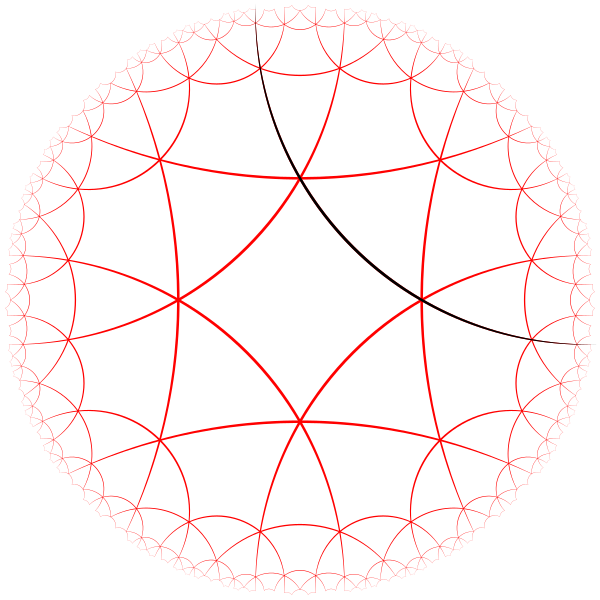

In [26]:
p1 = 4
p2 = 3
q = 3
rotate = 0

theta1, theta2 = math.pi*2/p1, math.pi*2/p2
phiSum = math.pi*2/q
r1 = triangleSideForAngles(theta1/2, phiSum/2, theta2/2)
r2 = triangleSideForAngles(theta2/2, phiSum/2, theta1/2)

tGen1 = htiles.TileGen.makeRegular(p1, hr=r1, skip=1)
tGen2 = htiles.TileGen.makeRegular(p2, hr=r2, skip=1)

tLayout = htiles.TileLayout()
tLayout.addGenerator(tGen1, (1,)*p1)
tLayout.addGenerator(tGen2, (0,)*p2, htiles.TileDecoratorNull())
startTile = tLayout.defaultStartTile(rotateDeg=rotate)

t1 = startTile
t2 = tLayout.placeTile(t1.sides[-1])
t3 = tLayout.placeTile(t2.sides[-1])
pointBase = t3.vertices[-1]
points = [Transform.rotation(deg=i*360/p1).applyToPoint(pointBase)
          for i in range(p1)]
vertices = startTile.vertices
edges = []
for i, point in enumerate(points):
    v1 = vertices[i]
    v2 = vertices[(i+1)%p1]
    edge = Hypercycle.fromPoints(*v1, *v2, *point, segment=True, excludeMid=True)
    edges.append(edge)
decoratePoly = Polygon(edges=edges, vertices=vertices)
decorator1 = htiles.TileDecoratorPolygons(decoratePoly)
tLayout.setDecorator(decorator1, 0)

startTile = tLayout.defaultStartTile(rotateDeg=rotate)
tiles = tLayout.tilePlane(startTile, depth=6)

d = Drawing(2, 2, origin='center')
#d.draw(euclid.shapes.Circle(0, 0, 1), fill='silver')
for tile in tiles:
    d.draw(tile, hwidth=0.02, fill='red')
tiles[0].decorator = None
d.draw(Hypercycle.fromPoints(*tiles[0].vertices[0],
                             *tiles[0].vertices[1],
                             *pointBase),
       hwidth=0.02, fill='black')

d.setRenderSize(w=600)
d